# Question 1 & 2

### 1. Understanding Gradient Descent and Momentum [3 Marks]

-  **[2 marks]** Implement full-batch gradient descent and stochastic gradient descent for linear regression using the given datasets. Define the convergence criterion as reaching an $\epsilon$-neighborhood of the minimizer, with $\epsilon = 0.001$. Here, this means that your estimated parameter vector $\theta_t$ is considered to have converged once it is within a distance of $\epsilon$ from the true minimizer $\theta^\*$. Formally: $\|\theta_t - \theta^\*\| < \epsilon$ .For each method and dataset, determine the average number of steps required to satisfy this convergence criterion. Visualize the convergence process over 15 epochs.Provide visualizations:
    - Contour plots of the optimization process at different epochs (or an animation/GIF).
    - A plot of loss versus epochs for each method and dataset.


In [70]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

In [71]:
num_samples = 40
np.random.seed(45)

# Generate data
x1 = np.random.uniform(-20, 20, num_samples)
f_x = 100*x1 + 1
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.ones((x1.shape[0], 2))
X[:, 1] = x1

In [72]:
def get_least_square_solution(X, y):
    theta = np.linalg.inv( X.T @ X ) @ ( X.T @ y )
    return theta

theta_star = get_least_square_solution(X,y)
theta_star

array([ 0.9507064 , 99.98412345])

In [73]:
def full_batch(X, y, lr = 1e-3, num_steps = 1e5, momentum = False):
    theta = np.random.randn(X.shape[1])
    theta_star = get_least_square_solution(X,y)
    steps = 0
    losses = []
    path = [theta]
    momentum_path = None
    if momentum:
        v = np.zeros_like(theta)
        momentum_path = [v]
    while steps < num_steps:
        steps += 1
        y_pred = X @ theta
        loss = np.mean((y_pred - y) ** 2)
        losses.append(loss)
        if momentum:
            v = v * 0.9 +  X.T @ (y_pred - y)/len(X) *lr
            theta = theta -  v
            momentum_path.append(v)
        else:
            theta = theta - lr * X.T @ (y_pred - y)/len(X)
        path.append(theta)
        # print(theta)
        if np.linalg.norm(theta - theta_star) < 1e-3:
            break

    print("Number of steps:", steps)
    print("Theta:", theta)
    print("Theta star:", theta_star)
    return np.array(losses), np.array(path), np.array(theta_star), np.array(momentum_path)


In [74]:
def stocastic(X,y, lr = 1e-3, num_steps = 1e6, momentum = False):
    theta = np.random.randn(X.shape[1])
    theta_star = get_least_square_solution(X,y)
    steps = 0
    losses = []
    path = [theta.copy()]
    momentum_path = None
    if momentum:
        v = np.zeros_like(theta)
        momentum_path = [v.copy()]

    while steps < num_steps:

        for i in range(len(X)):
            steps += 1
            y_pred = X[i] @ theta
            if momentum:
                v = v * 0.9 + lr * X[i] * (y_pred - y[i])
                theta = theta - v
                momentum_path.append(v.copy())

            else:
                theta = theta - lr * X[i] * (y_pred - y[i])

            loss = np.mean((y_pred - y[i]) ** 2)
            losses.append(loss)
            path.append(theta.copy())

            if np.linalg.norm(theta - theta_star) < 1e-3:
                break

        if np.linalg.norm(theta - theta_star) < 1e-3:
                break

    print("Number of steps:", steps)
    print("Theta:", theta)
    print("Theta star:", theta_star)

    return np.array(losses), np.array(path), np.array(theta_star), np.array(momentum_path)


In [75]:
print("Full Batch: \n")
full_batch_loss, full_batch_path, full_batch_theta_star, full_batch_momentum_path = full_batch(X,y)
print("\n\nStocastic: \n")
stocastic_loss, stocastic_path, stocastic_theta_star, stocastic_momentum_path = stocastic(X,y)

Full Batch: 

Number of steps: 8011
Theta: [ 0.94970677 99.98410994]
Theta star: [ 0.9507064  99.98412345]


Stocastic: 

Number of steps: 4434
Theta: [ 0.9500264  99.98461286]
Theta star: [ 0.9507064  99.98412345]


In [76]:
from matplotlib.animation import FuncAnimation

def visualize(path, theta_star, X, y, theta0_range, theta1_range, num_steps = 15):

    def func(theta0, theta1, X, y):
        y_pred = theta0[..., None] + theta1[..., None] * X[:,1]
        return np.mean((y_pred - y) ** 2, axis=-1)

    # theta0 = np.arange(-5, 10, 0.1)
    # theta1 = np.arange(-5, 10, 0.1)

    theta0 = np.arange(theta0_range[0], theta0_range[1], 0.1)
    theta1 = np.arange(theta1_range[0], theta1_range[1], 0.1)

    theta0, theta1 = np.meshgrid(theta0, theta1)
    Z = func(theta0, theta1, X, y)
    fig, ax = plt.subplots(figsize=(8, 6))

    contour = plt.contourf(theta0, theta1, Z, levels=100, cmap='rainbow')

    # Optional: Add contour lines for contrast
    ax.contour(theta0, theta1, Z, levels=20, colors='black', alpha=0.3, linewidths=0.5)
    # ax.contour( levels=30, cmap='gist_rainbow_r')
    point, = ax.plot([], [], 'ro', label='Current position')
    line, = ax.plot([], [], 'r--', lw=1, label='Path')
    ax.scatter(theta_star[0], theta_star[1], color='green', s=100, label='Minimum')
    ax.set_xlabel('theta0')
    ax.set_ylabel('theta1')
    ax.set_title('Gradient Descent Convergence (Animated)')
    ax.legend()

    # Initialization function

    visualise_path = path[::num_steps][:15]

    def init():
        point.set_data([], [])
        line.set_data([], [])
        return point, line

    # Update function
    def update(i):
        line.set_data(visualise_path[:i+1, 0], visualise_path[:i+1, 1])
        point.set_data([visualise_path[i, 0]], [visualise_path[i, 1]])  # wrap in lists
        return point, line

    # Animate
    ani = FuncAnimation(fig, update, frames=len(visualise_path), init_func=init,
                        interval=400, blit=True, repeat=False)

    return ani

In [77]:
full_batch_path[0]

array([-0.23257337,  1.18474619])

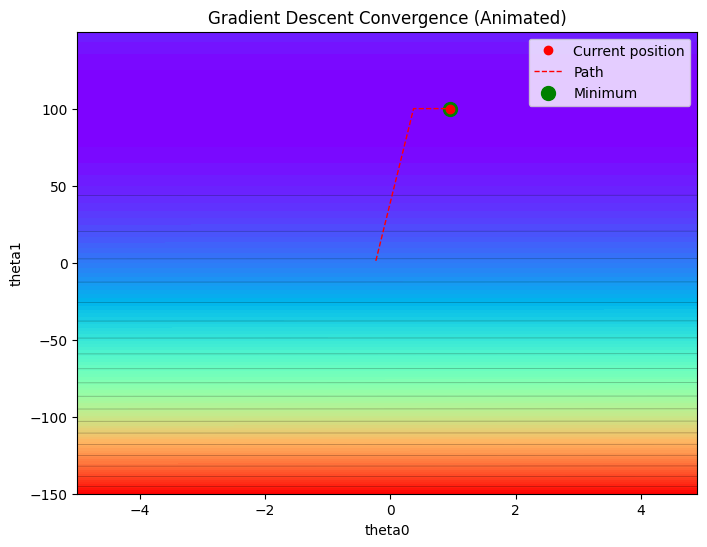

In [78]:
theta0_range = (-5, 5)
theta1_range = (-150, 150)
ani = visualize(full_batch_path[::100], full_batch_theta_star, X, y, theta0_range, theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

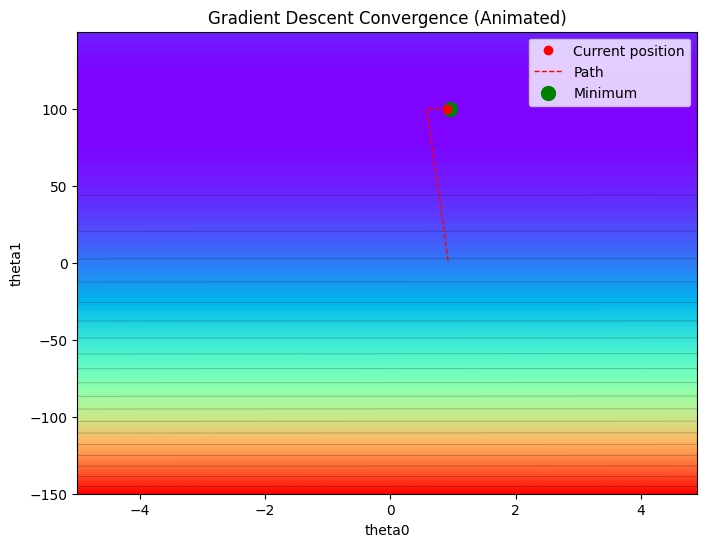

In [79]:
theta0_range = (-5, 5)
theta1_range = (-150, 150)
ani = visualize(stocastic_path[::10], stocastic_theta_star, X, y, theta0_range, theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

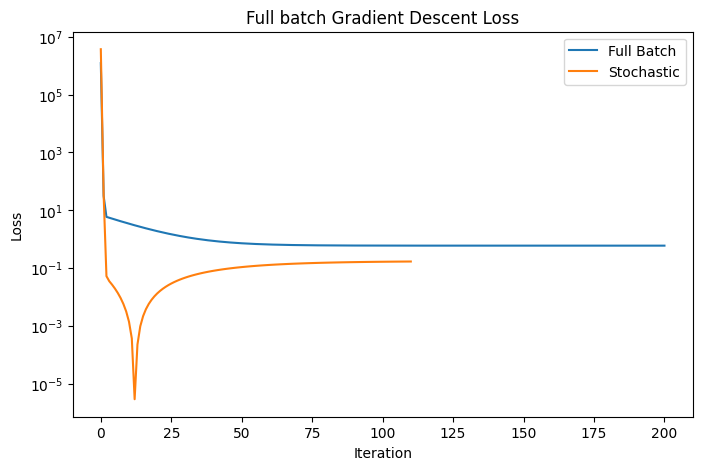

In [80]:
plt.figure(figsize=(8, 5))
plt.plot(full_batch_loss[::40])
plt.plot(stocastic_loss[::40])
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.yscale("log")
plt.title("Full batch Gradient Descent Loss")
plt.legend(["Full Batch", "Stochastic"])
plt.show()


In [81]:
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3*x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.ones((x1.shape[0], 2))
X[:, 1] = x1

In [82]:
print("Full Batch: \n")
full_batch_loss, full_batch_path, full_batch_theta_star, full_batch_momentum_path = full_batch(X,y)
print("\n\nStocastic: \n")
stocastic_loss, stocastic_path, stocastic_theta_star, stocastic_momentum_path = stocastic(X,y)

Full Batch: 

Number of steps: 24864
Theta: [3.95058536 2.68147632]
Theta star: [3.9507064  2.68246893]


Stocastic: 

Number of steps: 22076
Theta: [3.95019028 2.68162716]
Theta star: [3.9507064  2.68246893]


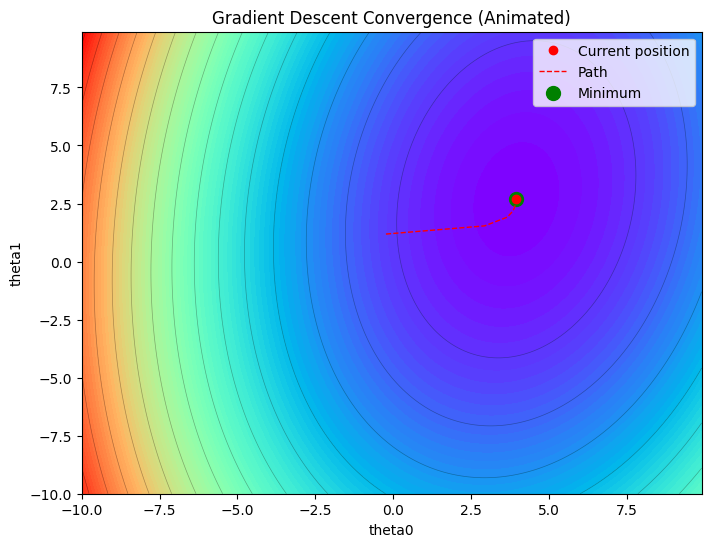

In [83]:
theta0_range = (-10, 10)
theta1_range = (-10, 10)
ani = visualize(full_batch_path[::100], full_batch_theta_star, X, y, theta0_range, theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

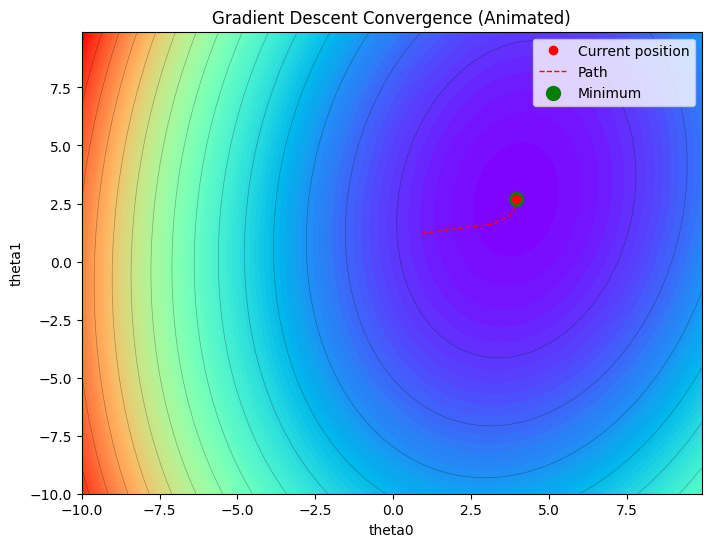

In [84]:
theta0_range = (-10, 10)
theta1_range = (-10, 10)
ani = visualize(stocastic_path[::100], stocastic_theta_star, X, y, theta0_range, theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

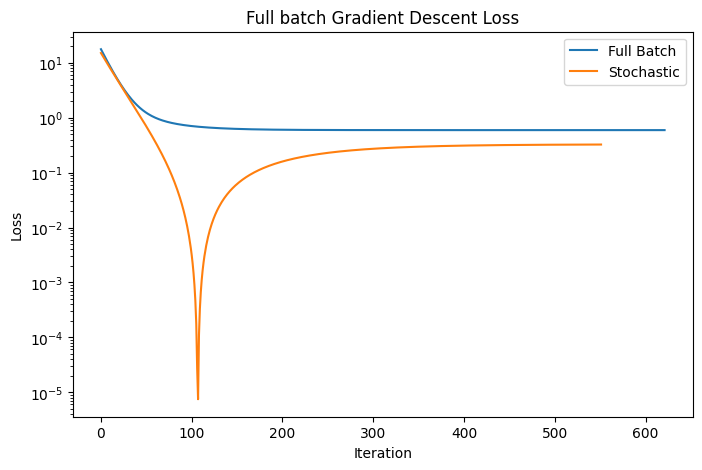

In [85]:
plt.figure(figsize=(8, 5))
plt.plot(full_batch_loss[::40])
plt.plot(stocastic_loss[::40])
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.yscale("log")
plt.title("Full batch Gradient Descent Loss")
plt.legend(["Full Batch", "Stochastic"])
plt.show()


- **[1 marks]** Explore the article [here](https://machinelearningmastery.com/gradient-descent-with-momentum-from-scratch/#:~:text=Momentum%20is%20an%20extension%20to,spots%20of%20the%20search%20space.) on gradient descent with momentum. Implement gradient descent with momentum for the above two datasets. Visualize the convergence process for 15 steps. Compare the average number of steps taken with gradient descent (both variants full batch and stochastic) with momentum to that of vanilla gradient descent to converge to an $\epsilon$-neighborhood of the minimizer for both datasets. Choose $\epsilon = 0.001$. Write down your observations. Show the contour plots for different epochs for momentum implementation. Specifically, show all the vectors: gradient, current value of theta, momentum, etc.

In [86]:
from matplotlib.animation import FuncAnimation

def visualize(path, theta_star, momentum_path, X, y, num_steps = 15, theta0_range = (-5, 5), theta1_range = (-50, 150), arrow_length = 0.02):
    
    def func(theta0, theta1, X, y):
        y_pred = theta0[..., None] + theta1[..., None] * X[:,1]  
        return np.mean((y_pred - y) ** 2, axis=-1)

    theta0 = np.arange(theta0_range[0], theta0_range[1], 0.1)
    theta1 = np.arange(theta1_range[0], theta1_range[1], 0.5)

    theta0, theta1 = np.meshgrid(theta0, theta1)
    Z = func(theta0, theta1, X, y)
    fig, ax = plt.subplots(figsize=(8, 6))

    contour = plt.contourf(theta0, theta1, Z, levels=100, cmap='rainbow')

    # Optional: Add contour lines for contrast
    ax.contour(theta0, theta1, Z, levels=20, colors='black', alpha=0.3, linewidths=0.5)
    # ax.contour( levels=30, cmap='gist_rainbow_r')
    point, = ax.plot([], [], 'ro', label='Current position')
    line, = ax.plot([], [], 'r--', lw=1, label='Path')
    # momentum_line, = ax.plot([], [], 'g--', lw=1, label='Momentum Path')
    current_momentum, = ax.plot([], [], 'go', label='Current momentum')
    
    momentum_arrow = ax.quiver(momentum_path[0, 0], momentum_path[0, 1], momentum_path[1, 0], momentum_path[1, 1], fc='blue', ec='blue')


    ax.scatter(theta_star[0], theta_star[1], color='green', s=100, label='Minimum')
    ax.set_xlabel('theta0')
    ax.set_ylabel('theta1')
    ax.set_title('Gradient Descent Convergence (Animated)')
    ax.legend()

    # Initialization function

    visualise_path = path[::num_steps][:15]
    visualise_momentum = momentum_path[::num_steps][:15]

    def init():
        point.set_data([], [])
        line.set_data([], [])
        # momentum_line.set_data([], [])
        current_momentum.set_data([], [])
        return point, line, current_momentum

    # Update function
    def update(i):
        line.set_data(visualise_path[:i+1, 0], visualise_path[:i+1, 1])
        point.set_data([visualise_path[i, 0]], [visualise_path[i, 1]])  # wrap in lists
        # momentum_line.set_data(visualise_momentum[:i+1, 0], visualise_momentum[:i+1, 1])
        current_momentum.set_data([visualise_momentum[i, 0]], [visualise_momentum[i, 1]])
        if i > 0:
            momentum_arrow.set_offsets([[visualise_path[i,0], visualise_path[i,1]]])
            dx = visualise_momentum[i, 0] - visualise_momentum[i-1, 0]
            dy = visualise_momentum[i, 1] - visualise_momentum[i-1, 1]
            norm = np.sqrt(dx**2 + dy**2)
            
            if norm == 0:
                dx_unit, dy_unit = 0, 0
            else:
                dx_unit, dy_unit = dx / norm, dy / norm

            # arrow_length = 0.05 * (max(theta0_range[1]-theta0_range[0], theta1_range[1]-theta1_range[0]))/15
            # arrow_length = 10
            momentum_arrow.set_UVC(dx_unit * arrow_length, dy_unit * arrow_length)
            # momentum_arrow.set_UVC(dx/np.abs(dx), dy/np.abs(dy))

        return point, line, current_momentum

    # Animate
    ani = FuncAnimation(fig, update, frames=len(visualise_path), init_func=init,
                        interval=400, blit=True, repeat=False)
    
    return ani
    

In [98]:
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3*x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps
X = np.ones((x1.shape[0], 2))
X[:, 1] = x1

print("Full Batch: \n")
full_batch_loss, full_batch_path, full_batch_theta_star, full_batch_momentum_path = full_batch(X,y, momentum = True)
print("\n\nStocastic: \n")
stocastic_loss, stocastic_path, stocastic_theta_star, stocastic_momentum_path = stocastic(X,y, momentum = True)

Full Batch: 

Number of steps: 2422
Theta: [3.95058542 2.68147685]
Theta star: [3.9507064  2.68246893]


Stocastic: 

Number of steps: 2122
Theta: [3.94979368 2.68237918]
Theta star: [3.9507064  2.68246893]


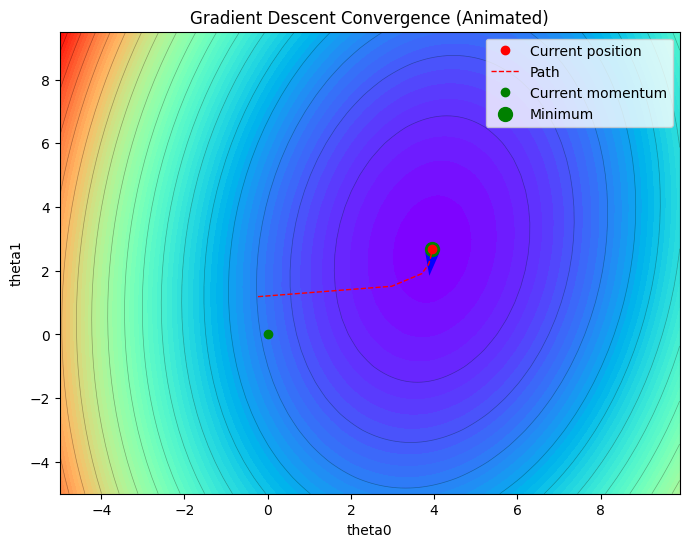

In [88]:
theta0_range = (-5, 10)
theta1_range = (-5, 10)
ani = visualize(full_batch_path[::10], full_batch_theta_star, -1 * full_batch_momentum_path[::10], X, y, theta0_range= theta0_range, theta1_range= theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

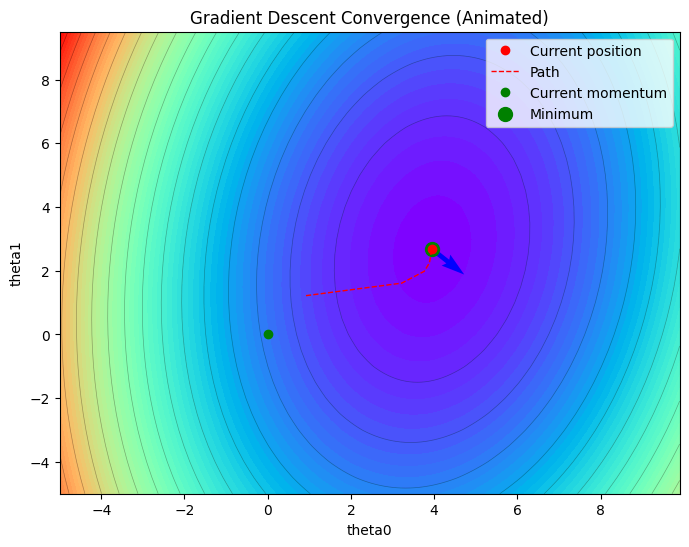

In [99]:
theta0_range = (-5, 10)
theta1_range = (-5, 10)
ani = visualize(stocastic_path[::10], stocastic_theta_star, -1 * stocastic_momentum_path[::10], X, y, theta0_range= theta0_range, theta1_range= theta1_range)
from IPython.display import HTML
HTML(ani.to_jshtml())

In [90]:
num_samples = 40
np.random.seed(45)

# Generate data
x1 = np.random.uniform(-20, 20, num_samples)
f_x = 100*x1 + 1
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.ones((x1.shape[0], 2))
X[:, 1] = x1

print("Full Batch: \n")
full_batch_loss, full_batch_path, full_batch_theta_star, full_batch_momentum_path = full_batch(X,y, momentum = True)
print("\n\nStocastic: \n")
stocastic_loss, stocastic_path, stocastic_theta_star, stocastic_momentum_path = stocastic(X,y, momentum = True)


Full Batch: 

Number of steps: 730
Theta: [ 0.94971467 99.98411005]
Theta star: [ 0.9507064  99.98412345]


Stocastic: 

Number of steps: 1000000
Theta: [ 0.84633498 99.95829057]
Theta star: [ 0.9507064  99.98412345]


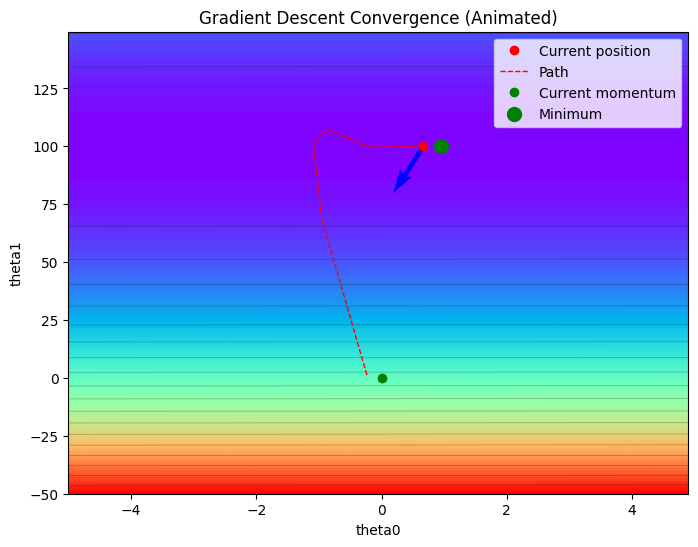

In [91]:
ani = visualize(full_batch_path, full_batch_theta_star, -1 * full_batch_momentum_path, X, y, arrow_length=20)
from IPython.display import HTML
HTML(ani.to_jshtml())

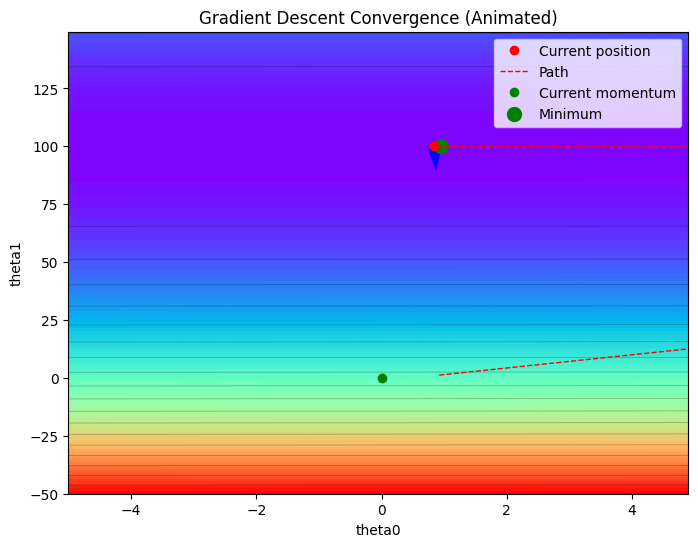

In [92]:
ani = visualize(stocastic_path[::10], stocastic_theta_star, -1 * stocastic_momentum_path[::10], X, y, arrow_length=20)
from IPython.display import HTML
HTML(ani.to_jshtml())

### 2. Effect Of Feature Scaling on Optimisation [2 Marks]

```python
num_samples = 100
np.random.seed(42)

# Generate data with large feature scale
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps
```

- **[1 marks]** Using the above dataset, implement full-batch gradient descent for linear regression on the dataset above without any feature scaling. Define the convergence criterion as reaching an epsilon-neighborhood of the empirical least squares minimizer θ*, with ε = 0.001 ( $\|\theta_t - \theta^*\| < \epsilon$ ). Determine the number of iterations required to satisfy this convergence criterion. Plot mse loss versus iterations plot.

In [93]:
num_samples = 100
np.random.seed(42)

x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.ones((x.shape[0], 2))
X[:, 1] = x

In [94]:
print("Full Batch: \n")
full_batch_loss, full_batch_path, full_batch_theta_star, full_batch_momentum_path = full_batch(X,y, lr = 6e-6)


Full Batch: 

Number of steps: 100000
Theta: [0.35981351 3.00236615]
Theta star: [2.21509616 2.99954023]


- **[1 marks]** Apply z-score normalization to the feature: $x_{\text{scaled}} = \frac{x - \mu_x}{\sigma_x}$ Run full-batch gradient descent on the scaled dataset with the same convergence criterion $(\epsilon = 0.001)$. Determine the number of iterations required for convergence. Plot mse loss versus iterations plot.

In [95]:
X[:, 1:] = (X[:, 1:] - np.mean(X[:, 1:], axis = 0))/np.std(X[:, 1:], axis = 0)

print("Full Batch: \n")
full_batch_loss_Z, full_batch_path_Z, full_batch_theta_star_Z, full_batch_momentum_path_Z = full_batch(X,y, lr = 2e-3)

Full Batch: 

Number of steps: 7157
Theta: [1412.54030378  887.85805781]
Theta star: [1412.54114977  887.85858784]


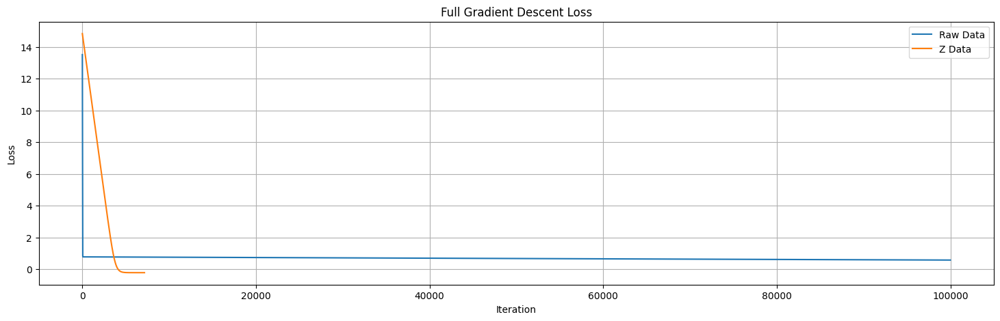

In [96]:
plt.figure(figsize=(18, 5))
plt.plot(np.log(full_batch_loss), label = "Raw Data")
plt.plot(np.log(full_batch_loss_Z), label = "Z Data")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Full Gradient Descent Loss")
plt.grid(True)
plt.legend()
plt.show()
